In [1]:
import cv2
import numpy as np
import os
import math

In [337]:
import os
import cv2

# -------------------------
# User-defined parameters
# -------------------------

# num 1
# video_path = "/media/kkondo/T7/dynus/tro_paper/hardware/uav/dynamic/num_1_folder/GX013922.MP4"  # Video file path
# output_folder = "/home/kkondo/MIT Dropbox/XXXXX XXXXX/Research/MIT/dynus/uav_dynamic/num_1/images"  # Folder to save images
# start_time_sec = 56.0   # Start time in seconds
# end_time_sec = 73.0     # End time in seconds

# num 1.5
# video_path = "/media/kkondo/T7/dynus/tro_paper/hardware/uav/dynamic/num_15_folder/GH013282.MP4"  # Video file path
# output_folder = "/home/kkondo/MIT Dropbox/XXXXX XXXXX/Research/MIT/dynus/uav_dynamic/num_1.5/images"  # Folder to save images
# start_time_sec = 37.0   # Start time in seconds
# end_time_sec = 49.0     # End time in seconds

# num 2
# video_path = "/media/kkondo/T7/dynus/tro_paper/hardware/uav/dynamic/num_2_folder/GX013926.MP4"  # Video file path
# output_folder = "/home/kkondo/MIT Dropbox/XXXXX XXXXX/Research/MIT/dynus/uav_dynamic/num_2/images"  # Folder to save images
# start_time_sec = 67.0   # Start time in seconds
# end_time_sec = 85.0     # End time in seconds

# num 2 - with east corner view
# video_path = "/media/kkondo/T7/dynus/tro_paper/hardware/uav/dynamic/num_2_folder/GH013285.MP4"  # Video file path
# output_folder = "/home/kkondo/MIT Dropbox/XXXXX XXXXX/Research/MIT/dynus/uav_dynamic/num_2/east_corner_images"  # Folder to save images
# start_time_sec = 63.0   # Start time in seconds
# end_time_sec = 81.0     # End time in seconds

# num 3
# video_path = "/media/kkondo/T7/dynus/tro_paper/hardware/uav/dynamic/num_3_folder/GX013931.MP4"  # Video file path
# output_folder = "/home/kkondo/MIT Dropbox/XXXXX XXXXX/Research/MIT/dynus/uav_dynamic/num_3/images"  # Folder to save images
# start_time_sec = 88.0   # Start time in seconds
# end_time_sec = 93.0     # End time in seconds

# num 3 - with east corner view
# video_path = "/media/kkondo/T7/dynus/tro_paper/hardware/uav/dynamic/num_3_folder/GH013290.MP4"  # Video file path
# output_folder = "/home/kkondo/MIT Dropbox/XXXXX XXXXX/Research/MIT/dynus/uav_dynamic/num_3/east_corner_images"  # Folder to save images
# start_time_sec = 79.0   # Start time in seconds
# end_time_sec = 104.0     # End time in seconds

# num 4
# video_path = "/media/kkondo/T7/dynus/tro_paper/hardware/uav/dynamic/num_4_folder/GX013934.MP4"  # Video file path
# output_folder = "/home/kkondo/MIT Dropbox/XXXXX XXXXX/Research/MIT/dynus/uav_dynamic/num_4/images"  # Folder to save images
# start_time_sec = 82.0   # Start time in seconds
# end_time_sec = 104.0     # End time in seconds

# num 4 - with east corner view
# video_path = "/media/kkondo/T7/dynus/tro_paper/hardware/uav/dynamic/num_4_folder/GH013293.MP4"  # Video file path
# output_folder = "/home/kkondo/MIT Dropbox/XXXXX XXXXX/Research/MIT/dynus/uav_dynamic/num_4/east_corner_images"  # Folder to save images
# start_time_sec = 89.0   # Start time in seconds
# end_time_sec = 100.0     # End time in seconds

# num 5
# video_path = "/media/kkondo/T7/dynus/tro_paper/hardware/uav/dynamic/num_5_folder/GX013934.MP4"  # Video file path
# output_folder = "/home/kkondo/MIT Dropbox/XXXXX XXXXX/Research/MIT/dynus/uav_dynamic/num_5/images"  # Folder to save images
# start_time_sec = 82.0   # Start time in seconds
# end_time_sec = 104.0     # End time in seconds

# num 5 - with east corner view
video_path = "/media/kkondo/T7/dynus/tro_paper/hardware/uav/dynamic/num_5_folder/GH013294.MP4"  # Video file path
output_folder = "/home/kkondo/MIT Dropbox/XXXXX XXXXX/Research/MIT/dynus/uav_dynamic/num_5/center_corner_images"  # Folder to save images
start_time_sec = 148.0   # Start time in seconds
end_time_sec = 172.0     # End time in seconds

desired_fps = 5         # Desired frame extraction rate (Hz)

# Create output folder if it doesn't exist
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# Open the video file
cap = cv2.VideoCapture(video_path)
if not cap.isOpened():
    raise IOError(f"Cannot open video file: {video_path}")

# Retrieve video properties
fps = cap.get(cv2.CAP_PROP_FPS)
total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
print(f"Video FPS: {fps:.2f}, Total Frames: {total_frames}")

# Convert start and end times to frame indices
start_frame = int(start_time_sec * fps)
end_frame = int(end_time_sec * fps)
if end_frame > total_frames:
    end_frame = total_frames
print(f"Processing frames from {start_frame} to {end_frame}")

# Compute the step size for extracting frames at approximately desired_fps
step = int(round(fps / desired_fps))
if step < 1:
    step = 1
print(f"Extracting every {step} frame(s) to achieve approximately {desired_fps} Hz")

frame_idx = start_frame
saved_frame_count = 0

while frame_idx < end_frame:
    # Set the video position to the desired frame
    cap.set(cv2.CAP_PROP_POS_FRAMES, frame_idx)
    ret, frame = cap.read()
    if not ret:
        break
    
    output_filename = os.path.join(output_folder, f"frame_{saved_frame_count:05d}.jpg")
    cv2.imwrite(output_filename, frame)
    print(f"Saved frame {saved_frame_count} (frame index: {frame_idx}) to {output_filename}")
    
    saved_frame_count += 1
    frame_idx += step

cap.release()


Video FPS: 59.94, Total Frames: 14284
Processing frames from 8871 to 10309
Extracting every 12 frame(s) to achieve approximately 5 Hz
Saved frame 0 (frame index: 8871) to /home/kkondo/MIT Dropbox/XXXXX XXXXX/Research/MIT/dynus/uav_dynamic/num_5/center_corner_images/frame_00000.jpg
Saved frame 1 (frame index: 8883) to /home/kkondo/MIT Dropbox/XXXXX XXXXX/Research/MIT/dynus/uav_dynamic/num_5/center_corner_images/frame_00001.jpg
Saved frame 2 (frame index: 8895) to /home/kkondo/MIT Dropbox/XXXXX XXXXX/Research/MIT/dynus/uav_dynamic/num_5/center_corner_images/frame_00002.jpg
Saved frame 3 (frame index: 8907) to /home/kkondo/MIT Dropbox/XXXXX XXXXX/Research/MIT/dynus/uav_dynamic/num_5/center_corner_images/frame_00003.jpg
Saved frame 4 (frame index: 8919) to /home/kkondo/MIT Dropbox/XXXXX XXXXX/Research/MIT/dynus/uav_dynamic/num_5/center_corner_images/frame_00004.jpg
Saved frame 5 (frame index: 8931) to /home/kkondo/MIT Dropbox/XXXXX XXXXX/Research/MIT/dynus/uav_dynamic/num_5/center_corner_i

/tmp/ipykernel_1995214/3771249891.py:262: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


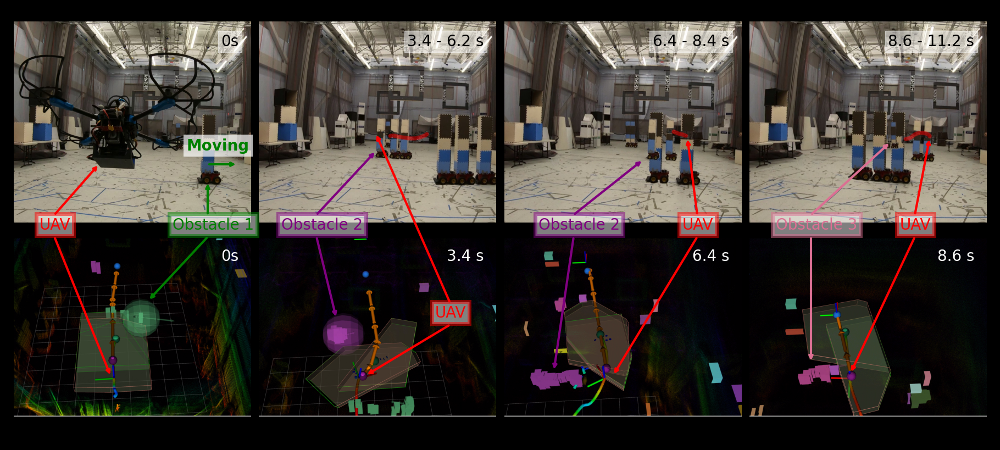

In [189]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from pathlib import Path
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# Prompt for input and output folder paths
output_folder = "/media/kkondo/T7/dynus/tro_paper/hardware/uav/dynamic/images"
output_path = Path(output_folder)
output_path.mkdir(parents=True, exist_ok=True)

images = [
    "/media/kkondo/T7/dynus/tro_paper/hardware/uav/dynamic/images/num_5_goodnoted/frame_00018.jpg",
    "/media/kkondo/T7/dynus/tro_paper/hardware/uav/dynamic/images/num_5_rviz/uav_hw_dynamic_rviz_num_5_1.png",
    "/media/kkondo/T7/dynus/tro_paper/hardware/uav/dynamic/images/num_5_goodnoted/frame_0035-0049.jpg",
    "/media/kkondo/T7/dynus/tro_paper/hardware/uav/dynamic/images/num_5_rviz/uav_hw_dynamic_rviz_num_5_2.png",
    "/media/kkondo/T7/dynus/tro_paper/hardware/uav/dynamic/images/num_5_goodnoted/frame_0050-0060.jpg",
    "/media/kkondo/T7/dynus/tro_paper/hardware/uav/dynamic/images/num_5_rviz/uav_hw_dynamic_rviz_num_5_3.png",
    "/media/kkondo/T7/dynus/tro_paper/hardware/uav/dynamic/images/num_5_goodnoted/frame_0061-0074.jpg",
    "/media/kkondo/T7/dynus/tro_paper/hardware/uav/dynamic/images/num_5_rviz/uav_hw_dynamic_rviz_num_5_4.png",
]

time_interval = 1 / 5  # 5Hz
time_texts = ["0s",
                "0s",
                f"{((35-18) * time_interval) + 0.0:.1f} - {((49-18) * time_interval) + 0.0:.1f} s",
                f"{((35-18) * time_interval) + 0.0:.1f} s",
                f"{((50-18) * time_interval) + 0.0:.1f} - {((60-18) * time_interval) + 0.0:.1f} s",
                f"{((50-18) * time_interval) + 0.0:.1f} s",
                f"{((61-18) * time_interval) + 0.0:.1f} - {((74-18) * time_interval) + 0.0:.1f} s",
                f"{((61-18) * time_interval) + 0.0:.1f} s"]

# Create a figure with 2 rows and 4 columns
fig = plt.figure(figsize=(18, 8))
gs = gridspec.GridSpec(2, 4, height_ratios=[1, 1], width_ratios=[1, 1, 1, 1])

# Plot each image in the grid
for idx in range(len(images)):

    img = mpimg.imread(str(images[idx]))
    ax = fig.add_subplot(gs[idx % 2, idx // 2])

    # if idx == 0:
    #     # Add a dot to indicate the start point
    #     ax.scatter(0.18, 0.2, s=100, c='red', marker='o', transform=ax.transAxes)
    #     # add a red text "start point"
    #     ax.text(0.1, 0.4, "Start",
    #             ha='left', va='center', transform=ax.transAxes,
    #             bbox = dict(facecolor='white', alpha=0.5, edgecolor='white'),
    #             fontsize=20, color='red')

    # if idx == len(images) - 2:
    #     # Add a dot to indicate the end point
    #     ax.scatter(0.43, 0.65, s=100, c='blue', marker='o', transform=ax.transAxes)
    #     # add a blue text "end point"
    #     ax.text(0.38, 0.82, "Goal",
    #             ha='left', va='center', transform=ax.transAxes,
    #             bbox = dict(facecolor='white', alpha=0.5, edgecolor='white'),
    #             fontsize=20, color='blue')
        
    # frame_00018.jpg is (2160,3840,3) sized - and needs to be resized
    if idx == 0:
        desired_width = 1668  # width of the smaller image
        desired_height = 938  # height of the smaller image
        img = cv2.resize(img, (desired_width, desired_height))

    # 1st row images (go-pro) need to be cropped
    if idx % 2 == 0:
        # right images (go-pro) need to be cropped
        img = img[100:img.shape[0] - 100, 300:img.shape[1] - 500]
        # add white text of time stamp
        ax.text(0.95, 0.9, time_texts[idx],
                     ha='right', va='center', transform=ax.transAxes, 
                     fontsize=20, color='black',
                     bbox=dict(facecolor='white', alpha=0.5, edgecolor='white'))

    # 2nd row images (rviz) need to be cropped
    if idx % 2 == 1:
        # right images (rviz) need to be cropped
        img = img[700:img.shape[0] - 100, 1000:img.shape[1] - 1000]
        # add white text of time stamp
        ax.text(0.95, 0.9, time_texts[idx],
                     ha='right', va='center', transform=ax.transAxes, 
                     fontsize=20, color='white')
    
    ax.imshow(img)
    ax.axis('off')


# Create an overlay Axes that covers the entire figure.
# This Axes will be invisible (no ticks or frame) and used for annotations that span across subplots.
overlay_ax = fig.add_axes([0, 0, 1, 1], zorder=10)
overlay_ax.axis('off')

# Add text for obstacle 1 using the overlay Axes
overlay_ax.text(0.21, 0.5, "Obstacle 1",
                ha='center', va='center',
                bbox=dict(facecolor='white', alpha=0.5, edgecolor='green', linewidth=5),
                fontsize=20, color='green')
overlay_ax.annotate("",
                    xy=(0.21, 0.61),      # arrow tip (end point)
                    xytext=(0.21, 0.535),    # arrow tail (start point)
                    arrowprops=dict(arrowstyle="->", color="green", linewidth=3),
                    xycoords='figure fraction',
                    textcoords='figure fraction')

overlay_ax.annotate("",
                    xy=(0.15, 0.34),      # arrow tip (end point)
                    xytext=(0.21, 0.485),    # arrow tail (start point)
                    arrowprops=dict(arrowstyle="->", color="green", linewidth=3),
                    xycoords='figure fraction',
                    textcoords='figure fraction')

# Add text for drone
overlay_ax.text(0.05, 0.5, "UAV",
                ha='center', va='center',
                bbox=dict(facecolor='white', alpha=0.5, edgecolor='red', linewidth=5),
                fontsize=20, color='red')
overlay_ax.annotate("",
                    xy=(0.1, 0.65),      # arrow tip (end point)
                    xytext=(0.055, 0.535),    # arrow tail (start point)
                    arrowprops=dict(arrowstyle="->", color="red", linewidth=3),
                    xycoords='figure fraction',
                    textcoords='figure fraction')
overlay_ax.annotate("",
                    xy=(0.112, 0.168),      # arrow tip (end point)
                    xytext=(0.055, 0.485),    # arrow tail (start point)
                    arrowprops=dict(arrowstyle="->", color="red", linewidth=3),
                    xycoords='figure fraction',
                    textcoords='figure fraction')

# Add text for obstacle 2 using the overlay Axes
overlay_ax.text(0.32, 0.5, "Obstacle 2",
                ha='center', va='center',
                bbox=dict(facecolor='white', alpha=0.5, edgecolor='purple', linewidth=5),
                fontsize=20, color='purple')

# Add an arrow for obstacle 1 using the overlay Axes with figure fraction coordinates
overlay_ax.annotate("",
                    xy=(0.38, 0.68),      # arrow tip (end point)
                    xytext=(0.32, 0.535),    # arrow tail (start point)
                    arrowprops=dict(arrowstyle="->", color="purple", linewidth=3),
                    xycoords='figure fraction',
                    textcoords='figure fraction')

overlay_ax.annotate("",
                    xy=(0.34, 0.3),      # arrow tip (end point)
                    xytext=(0.32, 0.485),    # arrow tail (start point)
                    arrowprops=dict(arrowstyle="->", color="purple", linewidth=3),
                    xycoords='figure fraction',
                    textcoords='figure fraction')

# Add text for drone
overlay_ax.text(0.45, 0.3, "UAV",
                ha='center', va='center',
                bbox=dict(facecolor='white', alpha=0.5, edgecolor='red', linewidth=5),
                fontsize=20, color='red')
overlay_ax.annotate("",
                    xy=(0.38, 0.72),      # arrow tip (end point)
                    xytext=(0.455, 0.335),    # arrow tail (start point)
                    arrowprops=dict(arrowstyle="->", color="red", linewidth=3),
                    xycoords='figure fraction',
                    textcoords='figure fraction')
overlay_ax.annotate("",
                    xy=(0.37, 0.17),      # arrow tip (end point)
                    xytext=(0.455, 0.285),    # arrow tail (start point)
                    arrowprops=dict(arrowstyle="->", color="red", linewidth=3),
                    xycoords='figure fraction',
                    textcoords='figure fraction')

# Add text for obstacle 2 using the overlay Axes
overlay_ax.text(0.58, 0.5, "Obstacle 2",
                ha='center', va='center',
                bbox=dict(facecolor='white', alpha=0.5, edgecolor='purple', linewidth=5),
                fontsize=20, color='purple')

# Add an arrow for obstacle 1 using the overlay Axes with figure fraction coordinates
overlay_ax.annotate("",
                    xy=(0.65, 0.66),      # arrow tip (end point)
                    xytext=(0.58, 0.535),    # arrow tail (start point)
                    arrowprops=dict(arrowstyle="->", color="purple", linewidth=3),
                    xycoords='figure fraction',
                    textcoords='figure fraction')

overlay_ax.annotate("",
                    xy=(0.56, 0.18),      # arrow tip (end point)
                    xytext=(0.58, 0.485),    # arrow tail (start point)
                    arrowprops=dict(arrowstyle="->", color="purple", linewidth=3),
                    xycoords='figure fraction',
                    textcoords='figure fraction')

# Add text for drone
overlay_ax.text(0.7, 0.5, "UAV",
                ha='center', va='center',
                bbox=dict(facecolor='white', alpha=0.5, edgecolor='red', linewidth=5),
                fontsize=20, color='red')
overlay_ax.annotate("",
                    xy=(0.695, 0.71),      # arrow tip (end point)
                    xytext=(0.705, 0.535),    # arrow tail (start point)
                    arrowprops=dict(arrowstyle="->", color="red", linewidth=3),
                    xycoords='figure fraction',
                    textcoords='figure fraction')
overlay_ax.annotate("",
                    xy=(0.62, 0.17),      # arrow tip (end point)
                    xytext=(0.705, 0.485),    # arrow tail (start point)
                    arrowprops=dict(arrowstyle="->", color="red", linewidth=3),
                    xycoords='figure fraction',
                    textcoords='figure fraction')

# Add text for obstacle 3 using the overlay Axes
overlay_ax.text(0.82, 0.5, "Obstacle 3",
                ha='center', va='center',
                bbox=dict(facecolor='white', alpha=0.5, edgecolor='palevioletred', linewidth=5),
                fontsize=20, color='palevioletred')

# Add an arrow for obstacle 1 using the overlay Axes with figure fraction coordinates
overlay_ax.annotate("",
                    xy=(0.9, 0.7),      # arrow tip (end point)
                    xytext=(0.82, 0.535),    # arrow tail (start point)
                    arrowprops=dict(arrowstyle="->", color="palevioletred", linewidth=3),
                    xycoords='figure fraction',
                    textcoords='figure fraction')

overlay_ax.annotate("",
                    xy=(0.82, 0.2),      # arrow tip (end point)
                    xytext=(0.82, 0.485),    # arrow tail (start point)
                    arrowprops=dict(arrowstyle="->", color="palevioletred", linewidth=3),
                    xycoords='figure fraction',
                    textcoords='figure fraction')

# Add text for drone
overlay_ax.text(0.92, 0.5, "UAV",
                ha='center', va='center',
                bbox=dict(facecolor='white', alpha=0.5, edgecolor='red', linewidth=5),
                fontsize=20, color='red')
overlay_ax.annotate("",
                    xy=(0.94, 0.71),      # arrow tip (end point)
                    xytext=(0.925, 0.535),    # arrow tail (start point)
                    arrowprops=dict(arrowstyle="->", color="red", linewidth=3),
                    xycoords='figure fraction',
                    textcoords='figure fraction')
overlay_ax.annotate("",
                    xy=(0.86, 0.175),      # arrow tip (end point)
                    xytext=(0.925, 0.485),    # arrow tail (start point)
                    arrowprops=dict(arrowstyle="->", color="red", linewidth=3),
                    xycoords='figure fraction',
                    textcoords='figure fraction')

# Add moving direction arrow and bold text
overlay_ax.text(0.215, 0.68, "Moving",
                weight='bold',
                ha='center', va='center',
                bbox=dict(facecolor='white', alpha=0.7, edgecolor='white', linewidth=0),
                fontsize=20, color='green')
overlay_ax.annotate("",
                    xy=(0.24, 0.65),      # arrow tip (end point)
                    xytext=(0.21, 0.65),    # arrow tail (start point)
                    arrowprops=dict(arrowstyle="->", color="green", linewidth=3),
                    xycoords='figure fraction',
                    textcoords='figure fraction')

plt.tight_layout()

# Define the path for the composite image and save it
composite_file = output_path / "num_5_composite_image.png"
plt.savefig(composite_file, bbox_inches='tight', dpi=300)
plt.savefig("/home/kkondo/paper_writing/DYNUS_paper/figures/hardware/uav_dynamic/num_5_composite_image.png", bbox_inches='tight')
plt.show()

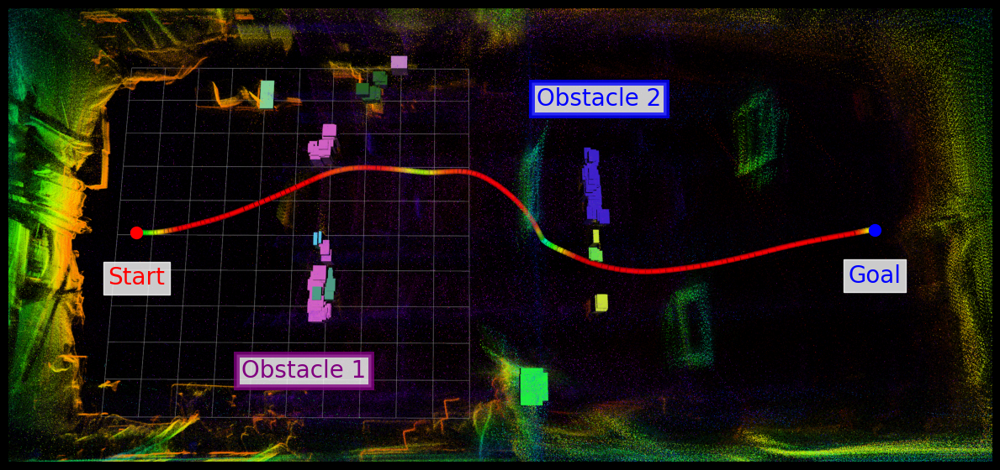

In [429]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
plt.style.use('dark_background')
# Load images
folder_path = "/media/kkondo/T7/dynus/tro_paper/hardware/uav/dynamic/num_4_folder"
image = plt.imread(folder_path + '/uav_hw_dynamic_num_4.png')

# Create a figure with GridSpec layout
fig_size_x = 12
fig_size_y = fig_size_x * 0.9
fig, ax = plt.subplots(figsize=(fig_size_x, fig_size_y))

# crop the images and create camera and actual path images from one image
image = image[600:image.shape[0]-300, 700:image.shape[1]-400]

# Just plot cropped image
ax.imshow(image)
ax.axis('off')

# Add a dot to indicate the start point
ax.scatter(0.13, 0.505, s=100, c='red', marker='o', transform=ax.transAxes)
# add a red text "start point"
ax.text(0.13, 0.405, "Start",
        ha='center', va='center', transform=ax.transAxes,
        bbox = dict(facecolor='white', alpha=0.8, edgecolor='white'),
        fontsize=20, color='red')
# Add a dot to indicate the end point
ax.scatter(0.88, 0.51, s=100, c='blue', marker='o', transform=ax.transAxes)
# add a blue text "end point"
ax.text(0.88, 0.41, "Goal",
        ha='center', va='center', transform=ax.transAxes,
        bbox = dict(facecolor='white', alpha=0.8, edgecolor='white'),
        fontsize=20, color='blue')

ax.text(0.3, 0.2, "Obstacle 1",
                ha='center', va='center', transform=ax.transAxes,
                bbox=dict(facecolor='white', alpha=0.8, edgecolor='purple', linewidth=5),
                fontsize=20, color='purple')
ax.text(0.6, 0.8, "Obstacle 2",
                ha='center', va='center', transform=ax.transAxes,
                bbox=dict(facecolor='white', alpha=0.8, edgecolor='blue', linewidth=5),
                fontsize=20, color='blue')

plt.tight_layout()

# Save the figure if SAVE is True
plt.savefig("/media/kkondo/T7/dynus/tro_paper/hardware/uav/dynamic/num_4_folder/rviz_overhead.png", bbox_inches='tight', dpi=300)
plt.show()

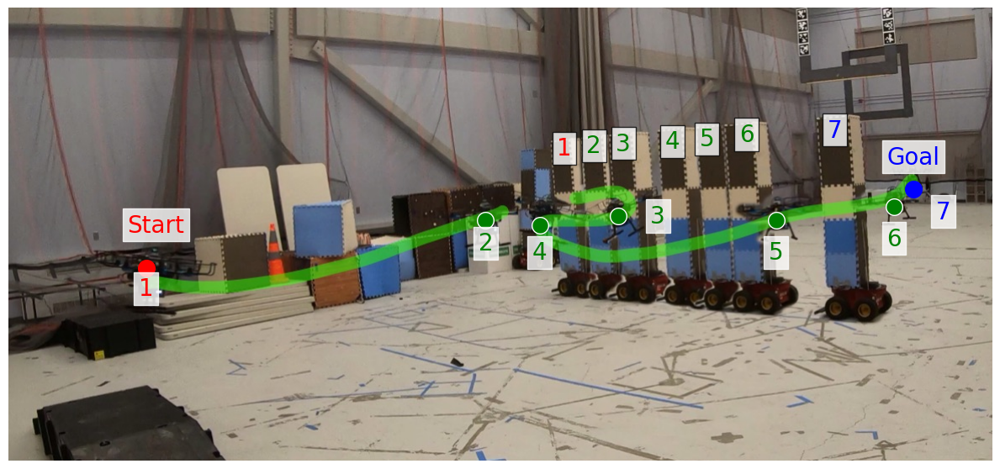

In [512]:
# num 1

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
# plt.style.use('dark_background')
plt.style.use('default')
# Load images
folder_path = "/home/kkondo/MIT Dropbox/XXXXX XXXXX/Research/MIT/dynus/uav_dynamic/num_1"
image = plt.imread(folder_path + '/num1_combined_annotated.jpg')

# Create a figure with GridSpec layout
fig_size_x = 12
fig_size_y = fig_size_x * 0.9
fig, ax = plt.subplots(figsize=(fig_size_x, fig_size_y))

# crop the images and create camera and actual path images from one image
image = image[200:image.shape[0]-200, 100:image.shape[1]-400]

# Just plot cropped image
ax.imshow(image)
ax.axis('off')

# Add a dot to indicate the start point
ax.scatter(0.14, 0.425, s=200, c='red', marker='o', transform=ax.transAxes)
# add a red text "start point"
ax.text(0.15, 0.52, "Start",
        ha='center', va='center', transform=ax.transAxes,
        bbox = dict(facecolor='white', alpha=0.8, edgecolor='white'),
        fontsize=20, color='red')
# Add a dot to indicate the end point
ax.scatter(0.92, 0.6, s=200, c='blue', marker='o', transform=ax.transAxes)
# add a blue text "end point"
ax.text(0.92, 0.67, "Goal",
        ha='center', va='center', transform=ax.transAxes,
        bbox = dict(facecolor='white', alpha=0.8, edgecolor='white'),
        fontsize=20, color='blue')

# green dot with white edge
ax.scatter(0.485, 0.53, s=200, c='green', marker='o', transform=ax.transAxes, edgecolor='white') #2
ax.scatter(0.62, 0.54, s=200, c='green', marker='o', transform=ax.transAxes, edgecolor='white') #3
ax.scatter(0.54, 0.52, s=200, c='green', marker='o', transform=ax.transAxes, edgecolor='white') #4
ax.scatter(0.78, 0.53, s=200, c='green', marker='o', transform=ax.transAxes, edgecolor='white') #5
ax.scatter(0.9, 0.56, s=200, c='green', marker='o', transform=ax.transAxes, edgecolor='white') #6

# agent
ax.text(0.14, 0.38, "1", ha='center', va='center', transform=ax.transAxes, bbox = dict(facecolor='white', alpha=0.8, edgecolor='white'), fontsize=20, color='red')
ax.text(0.485, 0.48, "2", ha='center', va='center', transform=ax.transAxes, bbox = dict(facecolor='white', alpha=0.8, edgecolor='white'), fontsize=20, color='green')
ax.text(0.66, 0.54, "3", ha='center', va='center', transform=ax.transAxes, bbox = dict(facecolor='white', alpha=0.8, edgecolor='white'), fontsize=20, color='green')
ax.text(0.54, 0.46, "4", ha='center', va='center', transform=ax.transAxes, bbox = dict(facecolor='white', alpha=0.8, edgecolor='white'), fontsize=20, color='green')
ax.text(0.78, 0.46, "5", ha='center', va='center', transform=ax.transAxes, bbox = dict(facecolor='white', alpha=0.8, edgecolor='white'), fontsize=20, color='green')
ax.text(0.9, 0.49, "6", ha='center', va='center', transform=ax.transAxes, bbox = dict(facecolor='white', alpha=0.8, edgecolor='white'), fontsize=20, color='green')
ax.text(0.95, 0.55, "7", ha='center', va='center', transform=ax.transAxes, bbox = dict(facecolor='white', alpha=0.8, edgecolor='white'), fontsize=20, color='blue')

# obstacle
ax.text(0.565, 0.69, "1", ha='center', va='center', transform=ax.transAxes, bbox = dict(facecolor='white', alpha=0.8, edgecolor='black'), fontsize=20, color='red')
ax.text(0.595, 0.695, "2", ha='center', va='center', transform=ax.transAxes, bbox = dict(facecolor='white', alpha=0.8, edgecolor='black'), fontsize=20, color='green')
ax.text(0.625, 0.7, "3", ha='center', va='center', transform=ax.transAxes, bbox = dict(facecolor='white', alpha=0.8, edgecolor='black'), fontsize=20, color='green')
ax.text(0.675, 0.705, "4", ha='center', va='center', transform=ax.transAxes, bbox = dict(facecolor='white', alpha=0.8, edgecolor='black'), fontsize=20, color='green')
ax.text(0.71, 0.71, "5", ha='center', va='center', transform=ax.transAxes, bbox = dict(facecolor='white', alpha=0.8, edgecolor='black'), fontsize=20, color='green')
ax.text(0.75, 0.72, "6", ha='center', va='center', transform=ax.transAxes, bbox = dict(facecolor='white', alpha=0.8, edgecolor='black'), fontsize=20, color='green')
ax.text(0.84, 0.73, "7", ha='center', va='center', transform=ax.transAxes, bbox = dict(facecolor='white', alpha=0.8, edgecolor='black'), fontsize=20, color='blue')

plt.tight_layout()

# Save the figure if SAVE is True
plt.savefig("/home/kkondo/MIT Dropbox/XXXXX XXXXX/Research/MIT/dynus/uav_dynamic/num_1/num1_combined_final.png", bbox_inches='tight', dpi=300)
plt.show()

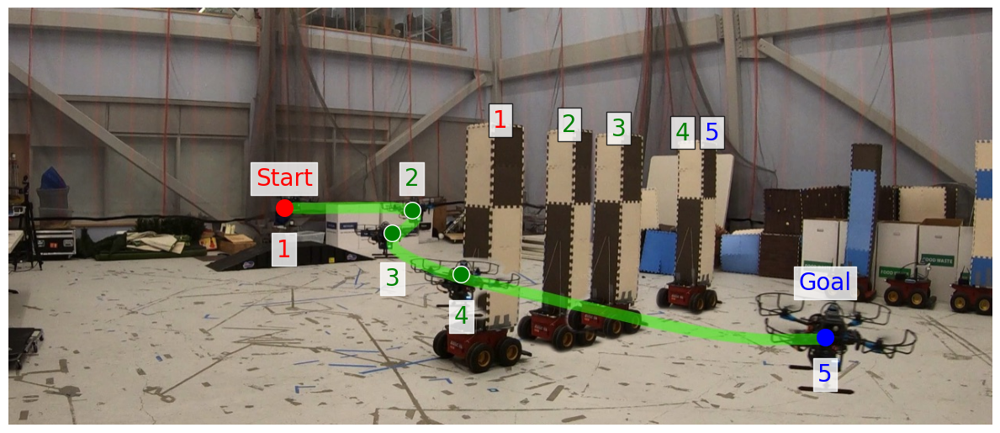

In [442]:
# num 1.5

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
# plt.style.use('dark_background')
plt.style.use('default')
# Load images
folder_path = "/home/kkondo/MIT Dropbox/XXXXX XXXXX/Research/MIT/dynus/uav_dynamic/num_1.5"
image = plt.imread(folder_path + '/num_15_combined_annotated.jpg')

# Create a figure with GridSpec layout
fig_size_x = 12
fig_size_y = fig_size_x * 0.9
fig, ax = plt.subplots(figsize=(fig_size_x, fig_size_y))

# crop the images and create camera and actual path images from one image
image = image[250:image.shape[0]-150, 400:image.shape[1]-0]

# Just plot cropped image
ax.imshow(image)
ax.axis('off')

# Add a dot to indicate the start point
ax.scatter(0.28, 0.52, s=200, c='red', marker='o', transform=ax.transAxes)
ax.text(0.28, 0.59, "Start", ha='center', va='center', transform=ax.transAxes, bbox = dict(facecolor='white', alpha=0.8, edgecolor='white'), fontsize=20, color='red')
ax.scatter(0.83, 0.21, s=200, c='blue', marker='o', transform=ax.transAxes)
ax.text(0.83, 0.34, "Goal", ha='center', va='center', transform=ax.transAxes, bbox = dict(facecolor='white', alpha=0.8, edgecolor='white'), fontsize=20, color='blue')

# green dot with white edge
ax.scatter(0.41, 0.515, s=200, c='green', marker='o', transform=ax.transAxes, edgecolor='white') #2
ax.scatter(0.39, 0.46, s=200, c='green', marker='o', transform=ax.transAxes, edgecolor='white') #3
ax.scatter(0.46, 0.36, s=200, c='green', marker='o', transform=ax.transAxes, edgecolor='white') #4

# agent
ax.text(0.28, 0.42, "1", ha='center', va='center', transform=ax.transAxes, bbox = dict(facecolor='white', alpha=0.8, edgecolor='white'), fontsize=20, color='red')
ax.text(0.41, 0.59, "2", ha='center', va='center', transform=ax.transAxes, bbox = dict(facecolor='white', alpha=0.8, edgecolor='white'), fontsize=20, color='green')
ax.text(0.39, 0.35, "3", ha='center', va='center', transform=ax.transAxes, bbox = dict(facecolor='white', alpha=0.8, edgecolor='white'), fontsize=20, color='green')
ax.text(0.46, 0.26, "4", ha='center', va='center', transform=ax.transAxes, bbox = dict(facecolor='white', alpha=0.8, edgecolor='white'), fontsize=20, color='green')
ax.text(0.83, 0.12, "5", ha='center', va='center', transform=ax.transAxes, bbox = dict(facecolor='white', alpha=0.8, edgecolor='white'), fontsize=20, color='blue')

# obstacle
ax.text(0.5, 0.73, "1", ha='center', va='center', transform=ax.transAxes, bbox = dict(facecolor='white', alpha=0.8, edgecolor='black'), fontsize=20, color='red')
ax.text(0.57, 0.72, "2", ha='center', va='center', transform=ax.transAxes, bbox = dict(facecolor='white', alpha=0.8, edgecolor='black'), fontsize=20, color='green')
ax.text(0.62, 0.71, "3", ha='center', va='center', transform=ax.transAxes, bbox = dict(facecolor='white', alpha=0.8, edgecolor='black'), fontsize=20, color='green')
ax.text(0.685, 0.7, "4", ha='center', va='center', transform=ax.transAxes, bbox = dict(facecolor='white', alpha=0.8, edgecolor='black'), fontsize=20, color='green')
ax.text(0.715, 0.7, "5", ha='center', va='center', transform=ax.transAxes, bbox = dict(facecolor='white', alpha=0.8, edgecolor='black'), fontsize=20, color='blue')

plt.tight_layout()

# Save the figure if SAVE is True
plt.savefig("/home/kkondo/MIT Dropbox/XXXXX XXXXX/Research/MIT/dynus/uav_dynamic/num_1.5/combined_final.png", bbox_inches='tight', dpi=300)
# plt.show()

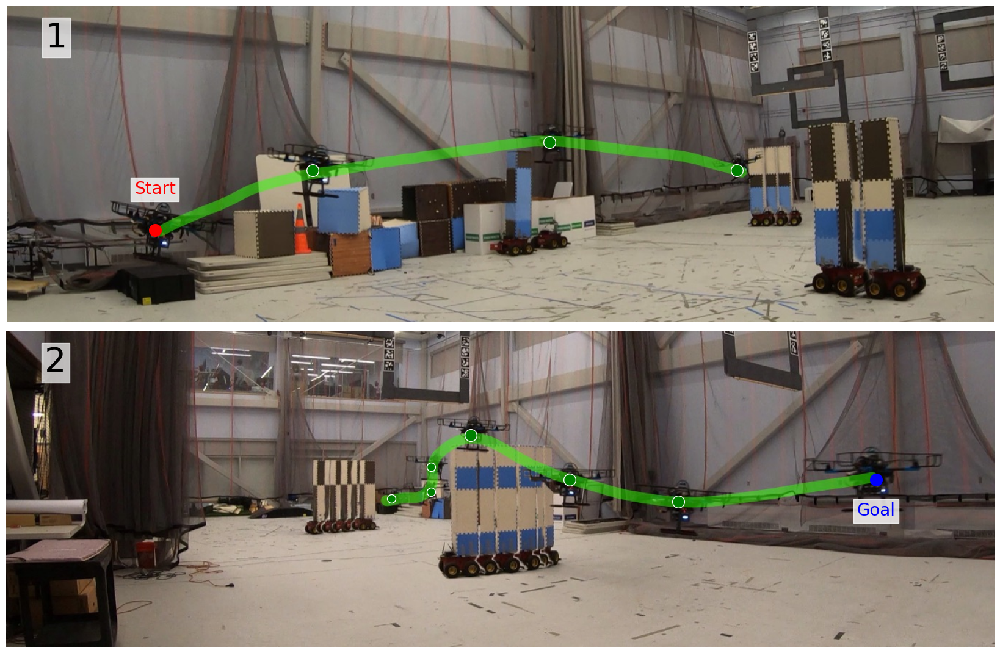

In [513]:
import matplotlib.pyplot as plt
import os

plt.style.use('default')

# Define the folder path and image file names.
folder_path = "/home/kkondo/MIT Dropbox/XXXXX XXXXX/Research/MIT/dynus/uav_dynamic/num_2"
file1 = "num_2_combined_part1_annotated.jpg"
file2 = "num_2_combined_part2_annotated.jpg"

# Load images.
image1 = plt.imread(os.path.join(folder_path, file1))
image2 = plt.imread(os.path.join(folder_path, file2))

# Crop the images.
# For both images, we crop rows from 200 to (height - 100) and columns from 100 to (width - 200).
image1 = image1[300:image1.shape[0]-200, 100:image1.shape[1]-200]
image2 = image2[300:image2.shape[0]-200, 100:image2.shape[1]-200]

# Create a figure with 1 row and 2 columns.
# Since the original individual figure had fig_size_x = 12 and fig_size_y ~ 10.8,
# we double the width (24) for a side-by-side layout.
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(24, 10.8))

# --------------------
# Plot for part 1 (Left subplot)
# --------------------
ax1.imshow(image1)
ax1.axis('off')

# Add a red dot and "Start" text.
ax1.scatter(0.15, 0.29, s=200, c='red', marker='o', transform=ax1.transAxes)
ax1.text(0.15, 0.42, "Start",
         ha='center', va='center', transform=ax1.transAxes,
         bbox=dict(facecolor='white', alpha=0.8, edgecolor='white'),
         fontsize=20, color='red')

# Add green dots.
ax1.scatter(0.31, 0.48, s=200, c='green', marker='o', transform=ax1.transAxes, edgecolor='white')
ax1.scatter(0.55, 0.57, s=200, c='green', marker='o', transform=ax1.transAxes, edgecolor='white')
ax1.scatter(0.74, 0.48, s=200, c='green', marker='o', transform=ax1.transAxes, edgecolor='white')
ax1.text(0.05, 0.9, "1", ha='center', va='center', transform=ax1.transAxes, bbox = dict(facecolor='white', alpha=0.7, edgecolor='white'), fontsize=40, color='black')

# --------------------
# Plot for part 2 (Right subplot)
# --------------------
ax2.imshow(image2)
ax2.axis('off')

# Add a blue dot and "Goal" text.
ax2.scatter(0.88, 0.53, s=200, c='blue', marker='o', transform=ax2.transAxes)
ax2.text(0.88, 0.43, "Goal",
         ha='center', va='center', transform=ax2.transAxes,
         bbox=dict(facecolor='white', alpha=0.8, edgecolor='white'),
         fontsize=20, color='blue')

# Add green dots.
ax2.scatter(0.39, 0.47, s=100, c='green', marker='o', transform=ax2.transAxes, edgecolor='white')
ax2.scatter(0.43, 0.49, s=100, c='green', marker='o', transform=ax2.transAxes, edgecolor='white')
ax2.scatter(0.43, 0.57, s=100, c='green', marker='o', transform=ax2.transAxes, edgecolor='white')
ax2.scatter(0.47, 0.67, s=200, c='green', marker='o', transform=ax2.transAxes, edgecolor='white')
ax2.scatter(0.57, 0.53, s=200, c='green', marker='o', transform=ax2.transAxes, edgecolor='white')
ax2.scatter(0.68, 0.46, s=200, c='green', marker='o', transform=ax2.transAxes, edgecolor='white')
ax2.text(0.05, 0.9, "2", ha='center', va='center', transform=ax2.transAxes, bbox = dict(facecolor='white', alpha=0.7, edgecolor='white'), fontsize=40, color='black')


# Adjust layout, and save or show the combined figure.
plt.tight_layout()
plt.savefig(os.path.join(folder_path, "combined_parts_final.png"), bbox_inches='tight', dpi=300)
plt.show()


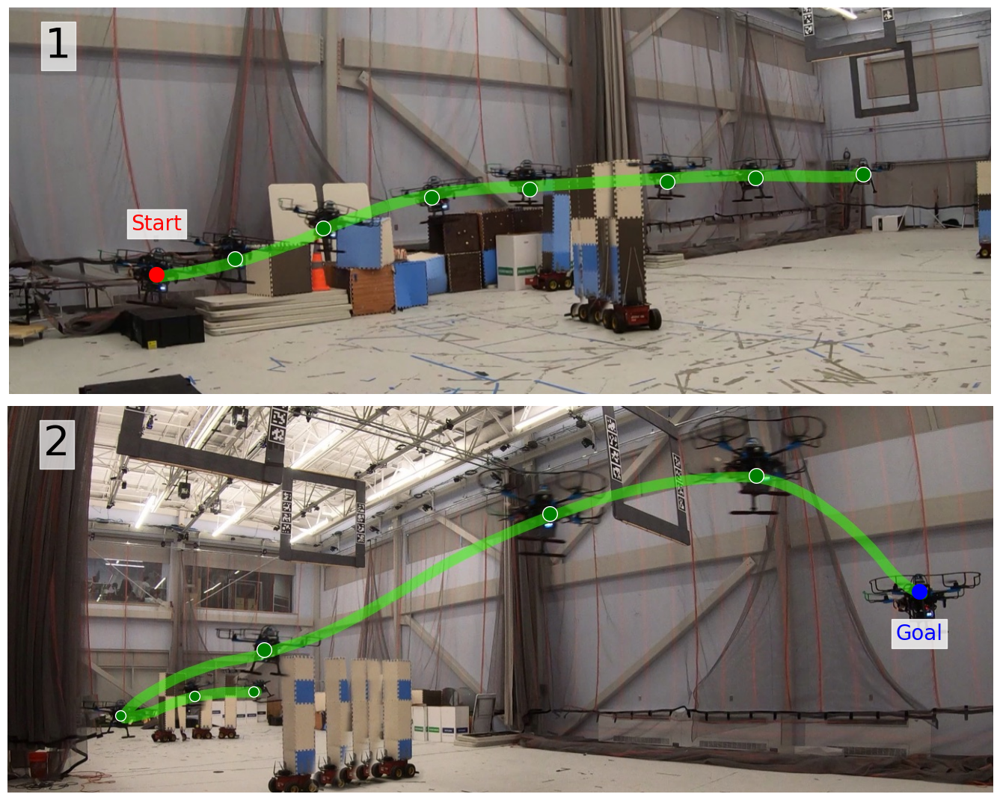

In [487]:
import matplotlib.pyplot as plt
import os

plt.style.use('default')

# Define the folder path and image file names.
folder_path = "/home/kkondo/MIT Dropbox/XXXXX XXXXX/Research/MIT/dynus/uav_dynamic/num_3"
file1 = "num_3_combined_part1_annotated.jpg"
file2 = "num_3_combined_part2_annotated.jpg"

# Load the images.
image1 = plt.imread(os.path.join(folder_path, file1))
image2 = plt.imread(os.path.join(folder_path, file2))

# Crop the images.
# For num 3 part1: crop rows from 200 to (height-100) and columns from 100 to (width-200)
image1 = image1[250:image1.shape[0]-200, 180:image1.shape[1]-250]
# For num 3 part2: crop rows from 100 to (height-200) and columns from 250 to (width-50)
image2 = image2[100:image2.shape[0]-300, 250:image2.shape[1]-50]

# Create a figure with 1 row and 2 columns.
# Each individual plot was originally 12x10.8, so we combine them to form a (24, 10.8) figure.
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(24, 10.8))

# ---------------------------
# Plot for "num 3 part1" (Left subplot)
# ---------------------------
ax1.imshow(image1)
ax1.axis('off')

# Add a red dot and "Start" label.
ax1.scatter(0.15, 0.31, s=200, c='red', marker='o', transform=ax1.transAxes)
ax1.text(0.15, 0.44, "Start", ha='center', va='center', transform=ax1.transAxes,
         bbox=dict(facecolor='white', alpha=0.8, edgecolor='white'), fontsize=20, color='red')

# Add green dots.
ax1.scatter(0.23, 0.35, s=200, c='green', marker='o', transform=ax1.transAxes, edgecolor='white')
ax1.scatter(0.32, 0.43, s=200, c='green', marker='o', transform=ax1.transAxes, edgecolor='white')
ax1.scatter(0.43, 0.51, s=200, c='green', marker='o', transform=ax1.transAxes, edgecolor='white')
ax1.scatter(0.53, 0.53, s=200, c='green', marker='o', transform=ax1.transAxes, edgecolor='white')
ax1.scatter(0.67, 0.55, s=200, c='green', marker='o', transform=ax1.transAxes, edgecolor='white')
ax1.scatter(0.76, 0.56, s=200, c='green', marker='o', transform=ax1.transAxes, edgecolor='white')
ax1.scatter(0.87, 0.57, s=200, c='green', marker='o', transform=ax1.transAxes, edgecolor='white')
ax1.text(0.05, 0.9, "1", ha='center', va='center', transform=ax1.transAxes, bbox = dict(facecolor='white', alpha=0.7, edgecolor='white'), fontsize=40, color='black')

# ---------------------------
# Plot for "num 3 part2" (Right subplot)
# ---------------------------
ax2.imshow(image2)
ax2.axis('off')

# Add a blue dot and "Goal" label.
ax2.scatter(0.925, 0.52, s=200, c='blue', marker='o', transform=ax2.transAxes)
ax2.text(0.925, 0.41, "Goal", ha='center', va='center', transform=ax2.transAxes,
         bbox=dict(facecolor='white', alpha=0.8, edgecolor='white'), fontsize=20, color='blue')

# Add green dots.
ax2.scatter(0.25, 0.26, s=100, c='green', marker='o', transform=ax2.transAxes, edgecolor='white')
ax2.scatter(0.19, 0.25, s=100, c='green', marker='o', transform=ax2.transAxes, edgecolor='white')
ax2.scatter(0.115, 0.2, s=100, c='green', marker='o', transform=ax2.transAxes, edgecolor='white')
ax2.scatter(0.26, 0.37, s=200, c='green', marker='o', transform=ax2.transAxes, edgecolor='white')
ax2.scatter(0.55, 0.72, s=200, c='green', marker='o', transform=ax2.transAxes, edgecolor='white')
ax2.scatter(0.76, 0.82, s=200, c='green', marker='o', transform=ax2.transAxes, edgecolor='white')
ax2.text(0.05, 0.9, "2", ha='center', va='center', transform=ax2.transAxes, bbox = dict(facecolor='white', alpha=0.7, edgecolor='white'), fontsize=40, color='black')


# Adjust layout and save or display the figure.
plt.tight_layout()
plt.savefig(os.path.join(folder_path, "combined_num3_final.png"), bbox_inches='tight', dpi=300)
plt.show()


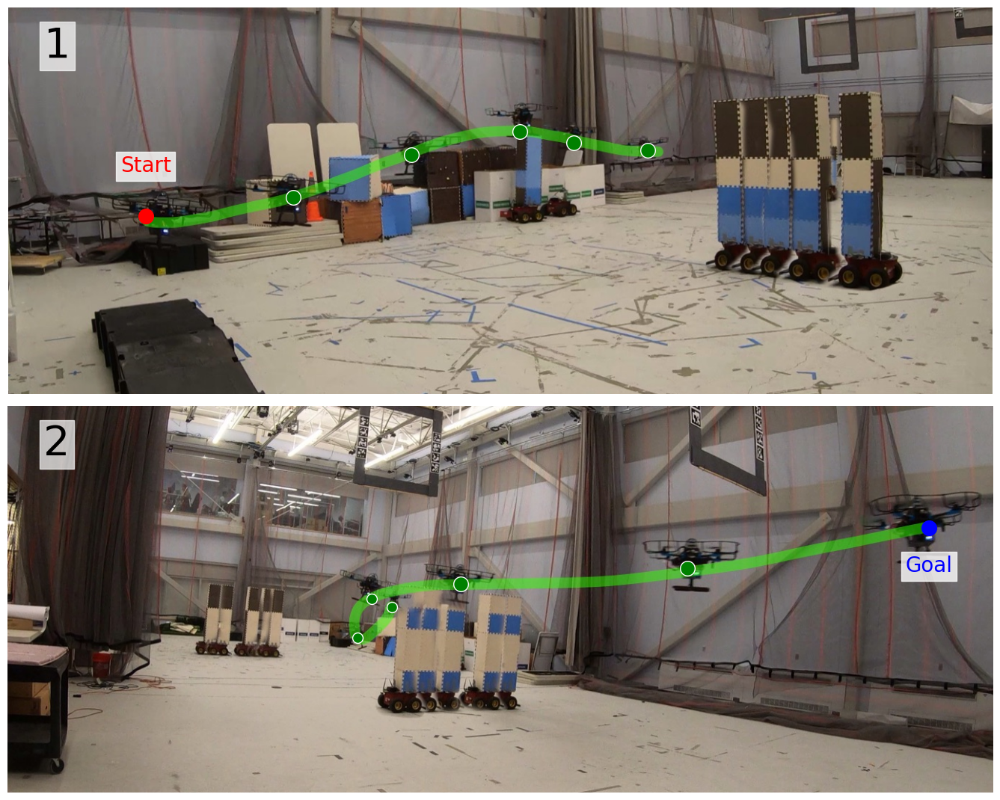

In [514]:
import matplotlib.pyplot as plt
import os

plt.style.use('default')

# Define folder path and file names.
folder_path = "/home/kkondo/MIT Dropbox/XXXXX XXXXX/Research/MIT/dynus/uav_dynamic/num_4"
file1 = "num4_combined_part1_annotated.jpg"
file2 = "num4_combined_part2_annotated.jpg"

# Load images.
image1 = plt.imread(os.path.join(folder_path, file1))
image2 = plt.imread(os.path.join(folder_path, file2))

# Crop the images.
# For part1, crop rows from 200 to (height-100) and columns from 100 to (width-200)
image1 = image1[250:image1.shape[0]-150, 100:image1.shape[1]-200]
# For part2, crop rows from 100 to (height-200) and columns from 250 to (width-50)
image2 = image2[200:image2.shape[0]-200, 250:image2.shape[1]-50]

# Create a figure with 2 rows and 1 column.
# Original dimensions for a single plot are 12 x 10.8, so we set the total height to about 21.6.
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(24, 10.8))

# ---------------------------
# Plot "num 4 part1" on the upper subplot (ax1)
# ---------------------------
ax1.imshow(image1)
ax1.axis('off')

# Add start point annotation: a red dot and "Start" text.
ax1.scatter(0.14, 0.46, s=200, c='red', marker='o', transform=ax1.transAxes)
ax1.text(0.14, 0.59, "Start", ha='center', va='center', transform=ax1.transAxes,
         bbox=dict(facecolor='white', alpha=0.8, edgecolor='white'), fontsize=20, color='red')

# Add green dots.
ax1.scatter(0.29, 0.51, s=200, c='green', marker='o', transform=ax1.transAxes, edgecolor='white')
ax1.scatter(0.41, 0.62, s=200, c='green', marker='o', transform=ax1.transAxes, edgecolor='white')
ax1.scatter(0.52, 0.68, s=200, c='green', marker='o', transform=ax1.transAxes, edgecolor='white')
ax1.scatter(0.575, 0.65, s=200, c='green', marker='o', transform=ax1.transAxes, edgecolor='white')
ax1.scatter(0.65, 0.63, s=200, c='green', marker='o', transform=ax1.transAxes, edgecolor='white')
ax1.text(0.05, 0.9, "1", ha='center', va='center', transform=ax1.transAxes, bbox = dict(facecolor='white', alpha=0.7, edgecolor='white'), fontsize=40, color='black')


# ---------------------------
# Plot "num 4 part2" on the lower subplot (ax2)
# ---------------------------
ax2.imshow(image2)
ax2.axis('off')

# Add goal annotation: a blue dot and "Goal" text.
ax2.scatter(0.935, 0.685, s=200, c='blue', marker='o', transform=ax2.transAxes)
ax2.text(0.935, 0.585, "Goal", ha='center', va='center', transform=ax2.transAxes,
         bbox=dict(facecolor='white', alpha=0.8, edgecolor='white'), fontsize=20, color='blue')

# Add green dots.
ax2.scatter(0.39, 0.48, s=100, c='green', marker='o', transform=ax2.transAxes, edgecolor='white')
ax2.scatter(0.355, 0.4, s=100, c='green', marker='o', transform=ax2.transAxes, edgecolor='white')
ax2.scatter(0.37, 0.5, s=100, c='green', marker='o', transform=ax2.transAxes, edgecolor='white')
ax2.scatter(0.46, 0.54, s=200, c='green', marker='o', transform=ax2.transAxes, edgecolor='white')
ax2.scatter(0.69, 0.58, s=200, c='green', marker='o', transform=ax2.transAxes, edgecolor='white')
ax2.text(0.05, 0.9, "2", ha='center', va='center', transform=ax2.transAxes, bbox = dict(facecolor='white', alpha=0.7, edgecolor='white'), fontsize=40, color='black')


# Adjust layout and save the final figure.
plt.tight_layout()
plt.savefig(os.path.join(folder_path, "combined_num4_final.png"), bbox_inches='tight', dpi=300)
plt.show()


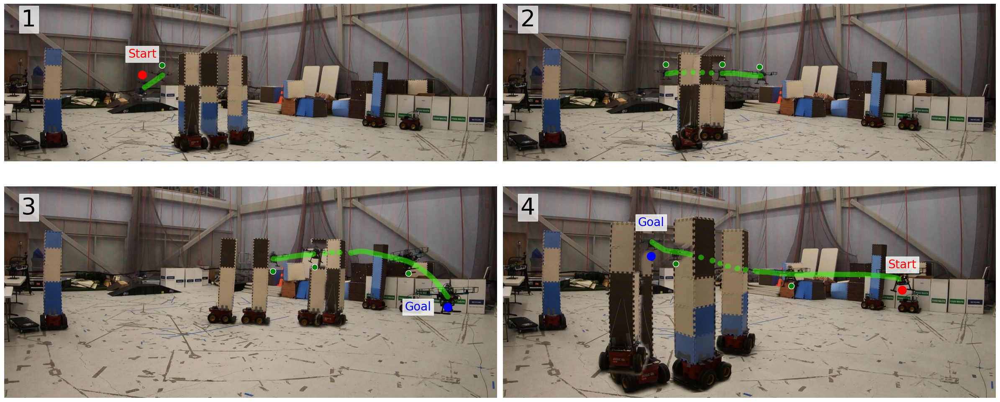

In [520]:
# num 5

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import os

# === Image Setup ===
folder_path = "/home/kkondo/MIT Dropbox/XXXXX XXXXX/Research/MIT/dynus/uav_dynamic/num_5"
image_files = [
    "num5_combined_part1-1.jpg",
    "num5_combined_part2-1.jpg",
    "num5_combined_part3-1.jpg",
    "num5_combined_part4-1.jpg"
]
images = [plt.imread(os.path.join(folder_path, f)) for f in image_files]

# === Figure Setup ===
fig_size_x = 24
fig_size_y = fig_size_x * 0.45
fig = plt.figure(figsize=(fig_size_x, fig_size_y))
gs = gridspec.GridSpec(2, 2)

# === Loop through each subplot ===
for i, img in enumerate(images):
    # Optional: Crop each image

    if i == 0 or i == 1:
        img = img[300:img.shape[0]-200, 250:img.shape[1]-50]
    else:
        img = img[300:img.shape[0]-50, 250:img.shape[1]-50]

    ax = fig.add_subplot(gs[i // 2, i % 2])
    ax.imshow(img)
    ax.axis('off')

    if i == 0:
        # Only add annotations to the first image
        ax.scatter(0.28, 0.55, s=200, c='red', marker='o', transform=ax.transAxes)
        ax.text(0.28, 0.68, "Start", ha='center', va='center', transform=ax.transAxes, bbox = dict(facecolor='white', alpha=0.8, edgecolor='white'), fontsize=20, color='red')
        ax.scatter(0.32, 0.61, s=100, c='green', marker='o', transform=ax.transAxes, edgecolor='white')
        # white text indicating the number top left
        ax.text(0.05, 0.9, "1", ha='center', va='center', transform=ax.transAxes, bbox = dict(facecolor='white', alpha=0.7, edgecolor='white'), fontsize=40, color='black')
    if i == 1:
        ax.scatter(0.33, 0.615, s=100, c='green', marker='o', transform=ax.transAxes, edgecolor='white')
        ax.scatter(0.445, 0.615, s=100, c='green', marker='o', transform=ax.transAxes, edgecolor='white')
        ax.scatter(0.52, 0.6, s=100, c='green', marker='o', transform=ax.transAxes, edgecolor='white')
        ax.text(0.05, 0.9, "2", ha='center', va='center', transform=ax.transAxes, bbox = dict(facecolor='white', alpha=0.7, edgecolor='white'), fontsize=40, color='black')
    if i == 2:
        ax.scatter(0.545, 0.6, s=100, c='green', marker='o', transform=ax.transAxes, edgecolor='white')
        ax.scatter(0.63, 0.62, s=100, c='green', marker='o', transform=ax.transAxes, edgecolor='white')
        ax.scatter(0.82, 0.59, s=100, c='green', marker='o', transform=ax.transAxes, edgecolor='white')
        ax.scatter(0.9, 0.43, s=100, c='green', marker='o', transform=ax.transAxes, edgecolor='white')
        ax.scatter(0.9, 0.43, s=200, c='blue', marker='o', transform=ax.transAxes)
        ax.text(0.84, 0.43, "Goal", ha='center', va='center', transform=ax.transAxes, bbox=dict(facecolor='white', alpha=0.8, edgecolor='white'), fontsize=20, color='blue')
        ax.text(0.05, 0.9, "3", ha='center', va='center', transform=ax.transAxes, bbox = dict(facecolor='white', alpha=0.7, edgecolor='white'), fontsize=40, color='black')
    if i == 3:
        ax.scatter(0.81, 0.51, s=200, c='red', marker='o', transform=ax.transAxes)
        ax.text(0.81, 0.63, "Start", ha='center', va='center', transform=ax.transAxes, bbox = dict(facecolor='white', alpha=0.8, edgecolor='white'), fontsize=20, color='red')
        ax.scatter(0.585, 0.53, s=100, c='green', marker='o', transform=ax.transAxes, edgecolor='white')
        ax.scatter(0.35, 0.635, s=100, c='green', marker='o', transform=ax.transAxes, edgecolor='white')
        ax.scatter(0.3, 0.67, s=200, c='blue', marker='o', transform=ax.transAxes)
        ax.text(0.3, 0.83, "Goal", ha='center', va='center', transform=ax.transAxes, bbox=dict(facecolor='white', alpha=0.8, edgecolor='white'), fontsize=20, color='blue')
        ax.text(0.05, 0.9, "4", ha='center', va='center', transform=ax.transAxes, bbox = dict(facecolor='white', alpha=0.7, edgecolor='white'), fontsize=40, color='black')

plt.tight_layout()

# Save the figure if SAVE is True
plt.savefig("/home/kkondo/MIT Dropbox/XXXXX XXXXX/Research/MIT/dynus/uav_dynamic/num_5/combined_final.png", bbox_inches='tight', dpi=300)
# plt.show()